In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score, precision_recall_fscore_support, precision_recall_curve, auc, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve, KFold, cross_val_predict
from sklearn.pipeline import Pipeline

import sys
sys.path.insert(0, "C:\\Users\\billy\\OneDrive\\Documents\\Python Scripts\\1. Portfolio\\predict-breast-cancer\\predict-breast-cancer")
import custom_funcs as cf

# Predicting breast cancer

* Anticipating and proactively addressing health challenges is a critical aspect of modern healthcare as early detection often leads to improved patient outcomes. For instance, if healthcare providers can diagnose cancer earlier, treatment strategies can be implemented before the progression of the disease. The goal of this project was, therefore, to predict breast cancer diagnosis using cell nuclei characteristics extracted from images of breast tissue.

* This workbook details the development of a binary classification model capable of predicting the occurence of cancer in the [Breast Cancer Wisconsin (Diagnostic) dataset](https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic).

# Scope

**a) Context**

* [Breast Cancer Wisconsin (Diagnostic) Dataset](https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic) is a real world multivariate dataset containing $30$ continuous features and a binary diagnosis target.

* Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.

**b) Model**

* The categorical target is binary. Consequently, the problem will be approached as a binary classification.

* No baseline model is available for benchmarking. The model will therefore be compared to a no-skill classifier.

**c) Technical requirements**

* In reality, predictions by the model would likely be generated for a batch of inputs on a recurring schedule (e.g. weekly) rather than processing each input data point individually in real time. Predictions would then nr stored in a database and made available to end users.

* At this stage, the model will not be deployed. However, batch inference will be assumed. This has several advantages:

    - there aren't low latency requirements (which place constraints on infrastructure and model complexity)

    - scalable compute resources can be used (e.g. batch inference using parallelisation via Spark)

    - predictions generated during batch inference can be analyzed and post processed before being seen by stakeholders

**d) Data requirements**

* No further data collection is required.

* No personal data is involved. Consequently there are no apparent legal/ethical constraints (e.g. GDPR).

# Import cleaned data

In [2]:
# Training data
clean_train_df = pd.read_csv('../data/cleaned/clean_train.csv')
print(f"Number of rows: {clean_train_df.shape[0]}")
print(f"Number of columns: {clean_train_df.shape[1]}")
clean_train_df.head(5)

Number of rows: 455
Number of columns: 31


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,9.029,17.33,58.79,250.5,0.10660,0.14130,0.31300,0.04375,0.2111,0.08046,...,22.65,65.50,324.7,0.14820,0.43650,1.25200,0.17500,0.4228,0.11750,1
1,21.090,26.57,142.70,1311.0,0.11410,0.28320,0.24870,0.14960,0.2395,0.07398,...,33.48,176.50,2089.0,0.14910,0.75840,0.67800,0.29030,0.4098,0.12840,0
2,9.173,13.86,59.20,260.9,0.07721,0.08751,0.05988,0.02180,0.2341,0.06963,...,19.23,65.59,310.1,0.09836,0.16780,0.13970,0.05087,0.3282,0.08490,1
3,10.650,25.22,68.01,347.0,0.09657,0.07234,0.02379,0.01615,0.1897,0.06329,...,35.19,77.98,455.7,0.14990,0.13980,0.11250,0.06136,0.3409,0.08147,1
4,10.170,14.88,64.55,311.9,0.11340,0.08061,0.01084,0.01290,0.2743,0.06960,...,17.45,69.86,368.6,0.12750,0.09866,0.02168,0.02579,0.3557,0.08020,1


In [3]:
# Test data
clean_test_df = pd.read_csv('../data/cleaned/clean_test.csv')
print(f"Number of rows: {clean_test_df.shape[0]}")
print(f"Number of columns: {clean_test_df.shape[1]}")
clean_train_df.head(5)

Number of rows: 114
Number of columns: 31


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,9.029,17.33,58.79,250.5,0.10660,0.14130,0.31300,0.04375,0.2111,0.08046,...,22.65,65.50,324.7,0.14820,0.43650,1.25200,0.17500,0.4228,0.11750,1
1,21.090,26.57,142.70,1311.0,0.11410,0.28320,0.24870,0.14960,0.2395,0.07398,...,33.48,176.50,2089.0,0.14910,0.75840,0.67800,0.29030,0.4098,0.12840,0
2,9.173,13.86,59.20,260.9,0.07721,0.08751,0.05988,0.02180,0.2341,0.06963,...,19.23,65.59,310.1,0.09836,0.16780,0.13970,0.05087,0.3282,0.08490,1
3,10.650,25.22,68.01,347.0,0.09657,0.07234,0.02379,0.01615,0.1897,0.06329,...,35.19,77.98,455.7,0.14990,0.13980,0.11250,0.06136,0.3409,0.08147,1
4,10.170,14.88,64.55,311.9,0.11340,0.08061,0.01084,0.01290,0.2743,0.06960,...,17.45,69.86,368.6,0.12750,0.09866,0.02168,0.02579,0.3557,0.08020,1


In [4]:
clean_train_df['target'] = clean_train_df['target'].astype('object')
clean_test_df['target'] = clean_test_df['target'].astype('object')

In [5]:
print(f'\n-----------------------------Training set-----------------------------\n')
display(clean_train_df.info())
print(f'\n-----------------------------Test set-----------------------------\n')
display(clean_test_df.info())


-----------------------------Training set-----------------------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455 entries, 0 to 454
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              455 non-null    float64
 1   mean texture             455 non-null    float64
 2   mean perimeter           455 non-null    float64
 3   mean area                455 non-null    float64
 4   mean smoothness          455 non-null    float64
 5   mean compactness         455 non-null    float64
 6   mean concavity           455 non-null    float64
 7   mean concave points      455 non-null    float64
 8   mean symmetry            455 non-null    float64
 9   mean fractal dimension   455 non-null    float64
 10  radius error             455 non-null    float64
 11  texture error            455 non-null    float64
 12  perimeter error          455 non-null    float64
 13  area er

None


-----------------------------Test set-----------------------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              114 non-null    float64
 1   mean texture             114 non-null    float64
 2   mean perimeter           114 non-null    float64
 3   mean area                114 non-null    float64
 4   mean smoothness          114 non-null    float64
 5   mean compactness         114 non-null    float64
 6   mean concavity           114 non-null    float64
 7   mean concave points      114 non-null    float64
 8   mean symmetry            114 non-null    float64
 9   mean fractal dimension   114 non-null    float64
 10  radius error             114 non-null    float64
 11  texture error            114 non-null    float64
 12  perimeter error          114 non-null    float64
 13  area error 

None

# Descriptive statistics

## Summary statistics

**_1) Continuous variables_**

* The mean and median values differ substantially for some variables (e.g. worst area). This suggests not all continuous variables exhibit symmetric frequency distributions.

In [6]:
clean_train_df.select_dtypes(include=['number']).describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,...,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000
mean,14.117635,19.185033,91.882242,654.377582,0.095744,0.103619,0.088898,0.048280,0.181099,0.062757,...,16.235103,25.535692,107.103121,876.987033,0.131532,0.252742,0.274595,0.114182,0.290502,0.083868
std,3.535815,4.266005,24.322027,354.943187,0.013923,0.052470,0.079468,0.038060,0.027487,0.007210,...,4.811267,6.065108,33.374664,567.672841,0.023083,0.155014,0.209398,0.065326,0.063151,0.017848
min,7.691000,9.710000,47.920000,170.400000,0.052630,0.019380,0.000000,0.000000,0.116700,0.049960,...,8.678000,12.020000,54.490000,223.600000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.705000,16.170000,75.100000,420.300000,0.085825,0.062890,0.029320,0.020340,0.161850,0.057645,...,13.055000,21.045000,84.255000,516.450000,0.114400,0.144950,0.116550,0.063930,0.249500,0.071050
50%,13.300000,18.680000,85.980000,551.700000,0.094620,0.090970,0.061540,0.033410,0.179200,0.061480,...,14.970000,25.220000,97.670000,686.600000,0.130900,0.210100,0.226400,0.098610,0.282700,0.080060
75%,15.740000,21.585000,103.750000,767.600000,0.104550,0.131300,0.132350,0.073895,0.195800,0.066100,...,18.410000,29.690000,124.650000,1031.500000,0.146050,0.341600,0.387200,0.161100,0.317750,0.092070
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.311400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.218400,0.937900,1.252000,0.291000,0.663800,0.173000


**_2) Categorical variables_**

* As expected, the number of unique values in the 'target' column is $2$. 

In [7]:
clean_train_df.select_dtypes(include=['object']).describe()

,target
count,455
unique,2
top,1
freq,286


## Frequency distributions

**_1) Continuous variables_**

* All distributions are non-normal with a positive skew.

    Note: [Skewness](https://en.wikipedia.org/wiki/Skewness) is a measurement of the distortion of symmetrical distribution or asymmetry in a data set. A standard normal distribution has a skewness of $0$.

* Kurtosis was not formally measured. However, outliers appear to be present for the following variables: perimeter error, area error and fractal dimension error.

    Note: [Kurtosis](https://en.wikipedia.org/wiki/Kurtosis) is a measure of the "tailedness" of a probability distribution. High kurtosis indicates there is an increased likelihood of extreme values (outliers). A standard normal distribution has a kurtosis of $3$.

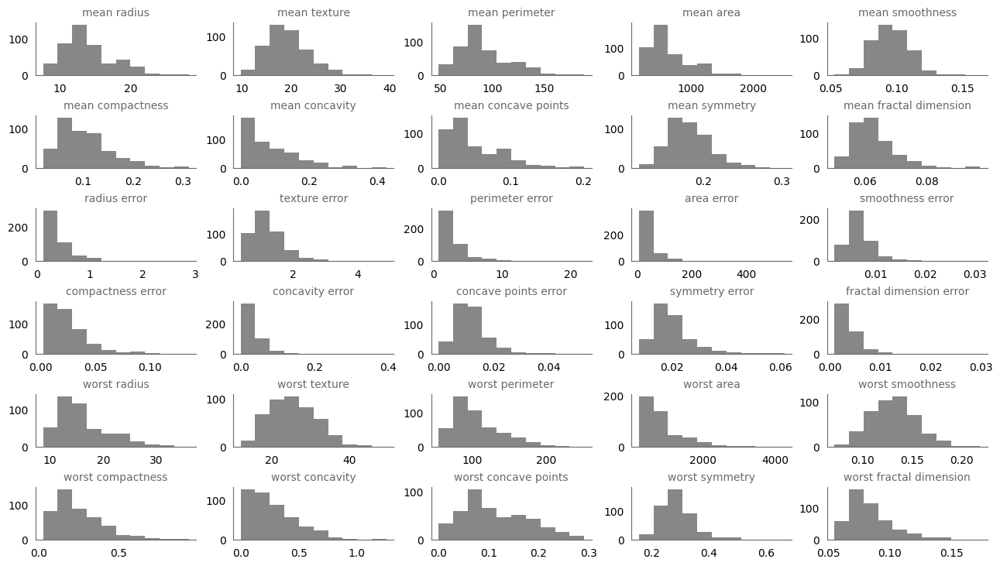

In [8]:
fig, axes = plt.subplots(
    nrows=6, ncols=5, constrained_layout=True, figsize=(6.4*2, 4.8*1.5))
i = 0
axes = axes.flatten()
for col in clean_train_df.select_dtypes(include=['number']).columns:
    axes[i].hist(clean_train_df[col], color='dimgray', alpha=0.8, label='')
    axes[i].set_title(col, fontsize=10, color='dimgray')
    i += 1

for ax in axes:
    ax.tick_params(bottom=False, left=False)
    ax.grid(False)
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color('dimgray')

**_2) Categorical variables_**
* The cardinality of the target variable is $2$.

* There is a slight class imbalance with $62.9\%$ of instances corresponding to a cancer diagnosis.

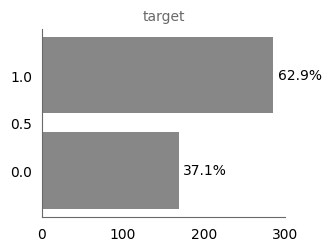

In [9]:
# Frequency plots
fig, axes = plt.subplots(
    nrows=1, ncols=1, constrained_layout=True, figsize=(6.4/2, 4.8/2)
)
counts = clean_train_df['target'].value_counts()
percs = clean_train_df['target'].value_counts(normalize=True)
rects = axes.barh(counts.index, counts.values,
                  color='dimgray', alpha=0.8)
axes.bar_label(rects, labels=[str(round(x*100, 1)) +
                              '%' for x in percs.values], padding=3)

axes.tick_params(bottom=False, left=False)
axes.grid(False)
axes.spines[['top', 'right']].set_visible(False)
axes.spines[['left', 'bottom']].set_color('dimgray')
axes.set_title('target', fontsize=10, color='dimgray');

## Missing values
* No missing values are present.

In [10]:
# Identify columns with missing values
nan_summary = pd.concat(
    [clean_train_df.isnull().sum()[(clean_train_df.isnull().sum() > 1)],
     clean_train_df.isnull().sum()[(clean_train_df.isnull().sum() > 1)] / clean_train_df.shape[0]],
    axis=1, keys=['Count', '%']
)
display(nan_summary)

# Count rows with more than one missing value
rows_with_multiple_missing = clean_train_df[clean_train_df.isnull().sum(axis=1) > 1]
print(f"Number of rows with more than one missing value: {len(rows_with_multiple_missing)}")

,Count,%


Number of rows with more than one missing value: 0


## Outliers
* The outliers in the 'perimeter error', 'area error' and 'fractal dimension' error column are left untouched. Instead their influence on later modelling will be assessed. If a value significantly affects outcomes, it may be excluded.

    *Note: The distribution are not normal so outliers cannot be excluded based on z-score.*

## Pairwise associations

### Continuous-continuous
* A matrix of scatter plots indicates a positive linear relationship between many of the predictive features.

* A correlation matrix displaying Pearson's correlation coefficient confirms a strong positive linear correlation between many of the variables. Multicollinearity is therefore displayed

    Note: It is assumed the departure from nomality exhibited by each predictive feature does not significantly effect correlation coefficients.

#### Background

**_1) Correlation versus association_**

* **_Correlation_**: A statistical measure that describes the extent to which two variables change together.
  
    *"As one variable increases, does the other variable increase or decrease?""*

* **_Association_**: A broader term that encompasses any relationship between variable. Not just correlation between numerical values.

  *"Is there a relationship between gender and whether someone visits the cinema?"*

**_2) Covariance_**

* It measures the joint variability & direction of the linear relationship between two variables $X$ and $Y$

    *Note: It is difficult to interpret the magnitude as it depends on the scale of the variables.*

* Definition:

    $Cov(X,Y) = \mathbb{E}\bigl[(X-\mathbb{E}X)(Y-\mathbb{E}Y) \bigr]$

* Population covariance: 

    $Cov(X,Y) = \frac{\sum (x_i - \mu_X)(y_i - \mu_Y)}{N}$

    *Where $Cov(X,Y)$ is the population covariance, $\mu_X$ and $\mu_Y$ are the population means and $N$ is the size of the population*

* Sample covariance:

    $cov(X,Y) = \frac{\sum (x_i - \bar{x})(y_i - \bar{y})}{n-1}$

    *Where $cov(X,Y)$ is the sample covariance, $\bar{x}$ and $\bar{y}$ are the sample means and $n$ is the size of the sample*

* Properties:

    $Cov(X,Y) \in [-\infty, +\infty]$

    $Cov(X, Y) = 0: $ No linear association between $X$ & $Y$

    Independent $X$ & $Y$: $Cov(X, Y) = 0$
  
    *Note: The converse is not necessarily true as it only assesses linear relationships*

* Assumptions:

    * Normal distribution for $X$ and $Y$

    * Linear relationship between $X$ and $Y$
 
[Source](https://www.probabilitycourse.com/chapter5/5_3_1_covariance_correlation.php)

**_3) Pearson correlation coefficient_**

* It measures the direction & strength of the linear relationship between two variables $X$ and $Y$

    *Note: It is the normalised version of covariance.*

* Definition:

    $r = \frac{Cov(X, Y)}{\sqrt{Var(X)Var(Y)}} = \frac{Cov(X, Y)}{Std(X)Std(Y)}$

* Population correlation coefficient:

    $\rho_{X,Y} = \frac{Cov(X,Y)}{\sqrt{Var(X)Var(Y)}} = \frac{Cov(X,Y)}{\sigma_X\sigma_Y}$

    *Where $Cov(X,Y)$ is the population covariance, $Var(X)$ and $Var(Y)$ are the population variances, and $\sigma_X$ and $\sigma_Y$ are the population standard deviations*

* Sample correlation coefficient:

    $r_{X,Y} = \frac{cov(X,Y)}{\sqrt{var(X)var(Y)}} = \frac{cov(X,Y)}{s_Xs_Y}$

    *Where $cov(X,Y)$ is the sample covariance, $var(X)$ and $var(Y)$ are the sample variances, and $s_X$ and $s_Y$ are the sample standard deviations*

* Properties:

    Dimensionless (no unit)

    $r \in [-1, 1]$

    $r=1:$ Perfect $+ve$ linear correlation where $Y=mX + c$ and $m>0$

    $r=-1:$ Perfect $-ve$ linear correlation where $Y=mX + c$ and $m<0$

    $r=0:$ No *linear* association between $X$ and $Y$

    Independent $X$ & $Y$: $Corr(X, Y) = 0$
  
    *Note: The converse is not necessarily true as it only assesses linear relationships*

* Assumptions:

    * Normal distribution for $X$ and $Y$
 
        *Note: Minor deviations from normality OK*

    * Linear relationship between $X$ and $Y$
 
[Source](https://www.probabilitycourse.com/chapter5/5_3_1_covariance_correlation.php)

**_4) Spearman's rank correlation coefficient_**

* It measures the direction & strength of a monotonic relationship between two variables $X$ and $Y$

* Definition:

    $r_s = \frac{Cov\bigl(r(X), r(Y)\bigr)}{\sqrt{Var\bigl(r(X)\bigr)Var\bigl(r(Y)\bigr)}} = \frac{Cov\bigl(r(X), r(Y)\bigr)}{Std\bigl(r(X)\bigr)Std\bigl(r(Y)\bigr)}$

    *Where the raw scores for $X$ and $Y$ are converted to ranks.*

* Properties:

    $r_s \in [-1, 1]$

    $r_s = 1:$ Observations in $X$ and $Y$ have the same rank. Perfectly increasing monotonic relationship. 

    $r_s = -1:$ Observations in $X$ and $Y$ have opposing ranks. Perfectly decreasing monotonic relationship. 

    $r_s = 0:$ No monotonic relationship.

* Assumptions:

    - Non-parametric
      
    - Relationship between $X$ and $Y$ must be monotonic (entirely non-increasing or non-decreasing)

#### Analyses

In [11]:
# Matrix of scatter plots
import warnings
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
sns.pairplot(clean_train_df.select_dtypes(include=['number']), diag_kind=None)

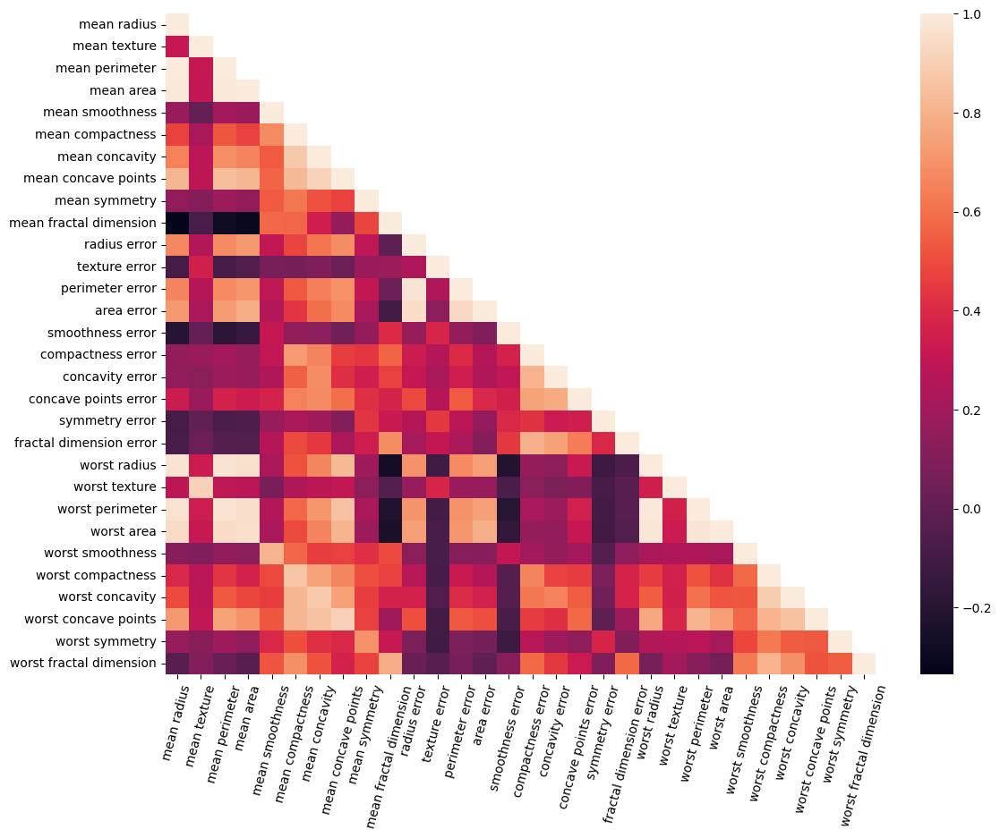

In [12]:
# Correlation matrix
pearson_corr = clean_train_df.select_dtypes(include=['number']).corr(method='pearson')
num_mask = np.tril(pearson_corr) == 0

fig, axes = plt.subplots(figsize=(6.4*2, 4.8*2))
sns.heatmap(pearson_corr, mask=num_mask, ax=axes)
xtick_labels = [item.get_text() for item in axes.get_xticklabels()]
axes.set_xticklabels(xtick_labels, rotation=75);

### Continuous-Categorical

* A matrix of boxplots indicates indicates a strong negative association between the target and the following attributes: 'radius', 'texture', 'perimeter', 'area', 'compactness', 'concavity', 'concave points', 'symmetry'.

* The point biserial correlation coefficient is computed between each predictive feature and the target. The results are displayed using a correlation matrix. A strong negative correlation between many of the continuous variables and the target is exhibited.

    *Note: The assumptions of point biserial correlation are violated. The continuous variables are not normally distributed and it is unclear if they are homoscedastic across groups.*

#### Background

**_1) Point-biserial correlation_**

1. What it measures?

    * Measures the direction & strength of <u>correlation</u> between a continuous variable and a dichotomous variable.
  
        $r_{pb} \in [-1, 1]$
    
        *A value close to $-1$ indicates a strong negative correlation, while a value close to $1$ indicates a strong positive correlation. A value of $0$ indicates no correlation.*
  
2. Assumptions:

   * The continuous variable is normally distributed.
     
   * The continuous variable is homoscedastic.
  
       *Note: Homoscedastic means homogeneity of variances. I.e. The variance of the continuous variable must be equal or similar in the different groups being compared.*

[Source](https://en.wikipedia.org/wiki/Point-biserial_correlation_coefficient)

**_2) One way ANOVA (Analysis of Variance) & Eta-squared_**

* Together these can be used to estimate the strength of <u>association</u>. Namely the variance of the continuous variable, which can be explained through the categorical variable.

**_One way ANOVA_**

1. What it Measures:

    * Whether there are statistically significant differences among the means of three or more groups.

2. Assumptions:

    * Normality: Dependent variable is approximately normally distributed within each group.
      
    * Homogeneity of Variances: Variances of the dependent variable are approximately equal across groups.
      
    * Independence: Observations are independent.

3. Hypotheses:

    * Null Hypothesis ($H_0$): The means of all groups are equal.
      
    * Alternative Hypothesis ($H_1$): At least one group mean is different.

4. Test Statistic:

    * The test statistic is the F-statistic, which follows an F-distribution
  
      $F = \frac{MS_{between}}{MS_{within}}$

      *Where $MS_{between}$ is Mean Square Between Groups and $MS_{between}$ is Mean Square Within Groups.*

5. Steps:

    * The test statistic is calculated.

    * If the p-value of the test statistic is below the chosen threshold, there is a statistically significant difference among the group means.
  
[Source](https://en.wikipedia.org/wiki/One-way_analysis_of_variance)

**_Eta-squared (η²)_**

1. What it Measures:

    * An effect size measurement for one-way ANOVA.

    * Eta-squared (η²) measures the proportion of total variance in the dependent variable that is attributable to the variance between groups in ANOVA.

2. Interpretation:

    $\eta^2 \in [0, 1]$

    *A value close to $0$ indicates a weak association, while a value close to $1$ indicates a strong association.*

[Source](https://en.wikiversity.org/wiki/Eta-squared)

#### Analyses

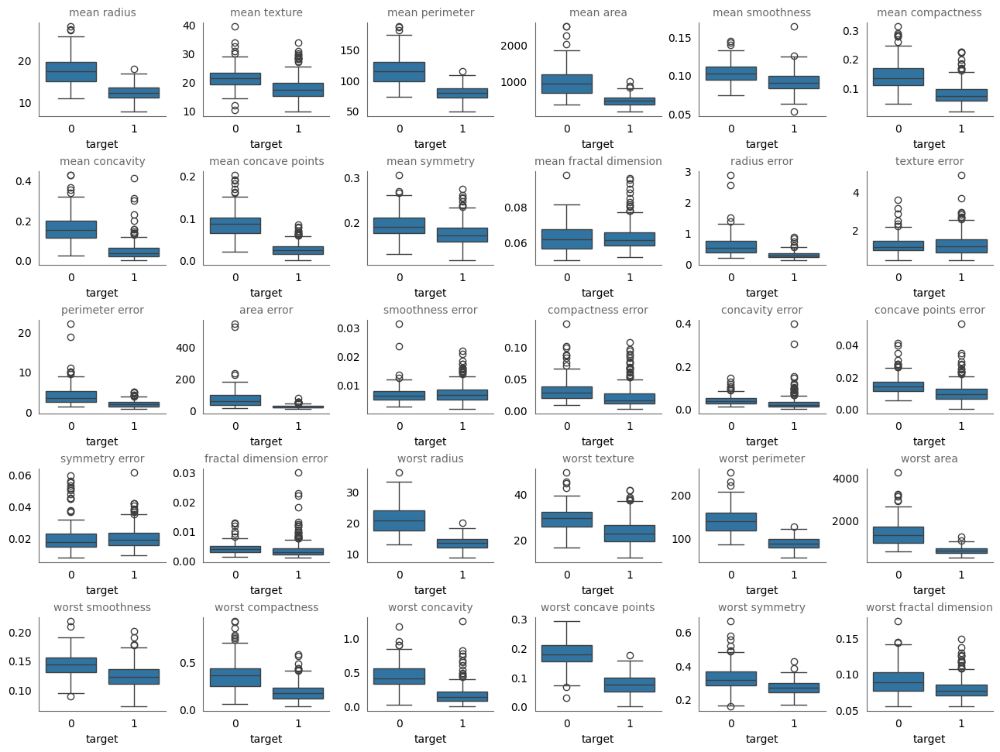

In [13]:
# Box plot
features = [col for col in clean_train_df.columns if col!='target']

fig, axes = plt.subplots(
    nrows=5, ncols=6, constrained_layout=True, figsize=(6.4*2, 4.8*2))
i = 0
axes = axes.flatten()
for col in features:
    sns.boxplot(x='target', y=col, data=clean_train_df, ax=axes[i])
    axes[i].set_title(col, fontsize=10, color='dimgray')
    axes[i].set_ylabel('')
    i += 1

for ax in axes:
    ax.tick_params(bottom=False, left=False)
    ax.grid(False)
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color('dimgray')
# fig.delaxes(axes[5])

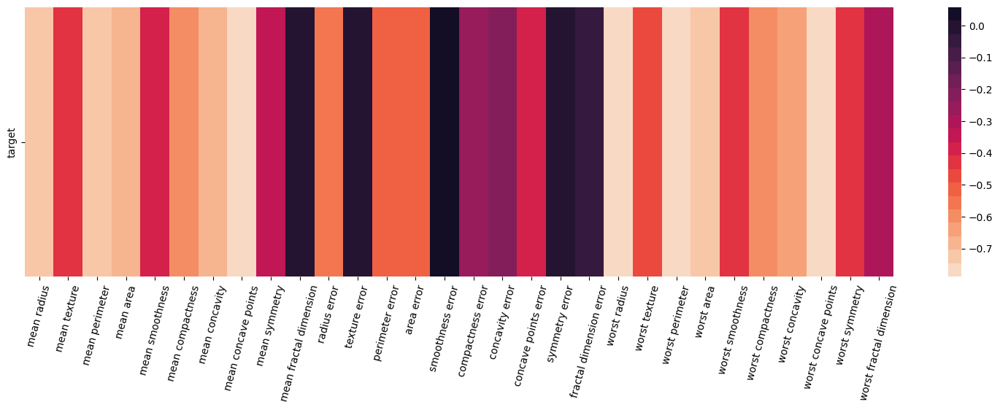

In [14]:
from custom_funcs import point_bs

object_cols = clean_train_df.select_dtypes(include=['object']).columns
num_cols = clean_train_df.select_dtypes(include=['number']).columns
pbs_corr = pd.DataFrame([[(row, col) for col in num_cols] for row in object_cols], columns=num_cols, index=object_cols)
pbs_corr = pbs_corr.map(lambda x: point_bs(x, df=clean_train_df))

fig, axes = plt.subplots(figsize=(6.4*3, 4.8))
sns.heatmap(pbs_corr, ax=axes, cmap=sns.color_palette("rocket_r", 20))
xtick_labels = [item.get_text() for item in axes.get_xticklabels()]
axes.set_xticklabels(xtick_labels, rotation=75);

### Multicollinearity

* Condition index was used to assess multicollinearity between continuous variables. The high value (>75,000) indicates strong multicollinearity.

* Principal component analysis will be applied in later modelling. Retaining $9$ principal components accounts for roughly $95.0\%$ of variance

* Visualisation of the first two principal components revealed a linear decision boundary.

#### Background

**_1) Multicollinearity_**

* Multicollinearity is when two or more independent variables (i.e. predictive features) are highly correlated, meaning they are <u>linearly</u> dependent on each other.

* It makes it difficult to isolate the individual effects of each variable on the dependent variable. This leads to problems assessing feature importance:

    1. **Coefficient P values are misleading**
           - Important variables may have higher, statistically insignificant, P-values (as importance split over correlated variables)

    2. **Unstable coefficients with high confidence intervals**
           - Coefficients vary depending on which variables included
           - Imprecise estimates of coefficients lead to inflated standard errors and confidence intervals (maybe including zero)

* Several strategies can be used to mitigate these problems:

    1. **Remove correlated predictors**
            - Remove variables clearly related to the other (e.g. X and 2X)
            - Use a latent (i.e. hidden) variable relating to correlated variables (e.g. speed replaces distance & time)

    2. **Combine correlated predictors**
           - Combine collerated variables using PCA
           - Calculate interaction terms - e.g product of the two that are correlated

    3. **Regularization**
           - Use L2 regularization to stabilise the size of the coefficients

**_2) PCA: Eigenvectors & eigenvalues_**

* Factorising a covariance matrix gives eigenvectors and corresponding eigenvalues

* Eigenvectors are orthogonal directions in the feature space along which data varies

* A **principal component** is formed by projecting data points onto an eigenvector

    *Note: Principal components are independent as eigen vectors are orthogonal*

* Eigenvalues are proportional to the variance of data along the direction of the corresponding eigenvector

**_3) Computing condition index_**

1. Factorising the covariance matrix gives eigenvectors and corresponding eigenvalues

2. Condition index is computed using the ratio of the maximum and minimum eigenvalues:

    $\text{Condition index} = \sqrt{\frac{\lambda_{max}}{\lambda_{min}}}$

    *Where $\lambda_{max}$ is the largest eigen value and $\lambda_{min}$ is the smallest.*

**_4) Intepretating condition index_**

* Eigenvalues equal to $0$ indicate perfect multicollinearity:

    $\text{Condition index} = NaN:$ -> *Perfect multicollinearity results in zero eigenvalue(s) and undefined condition index*

* A high proportion of variance explained by few components may suggest multicollinearity

* Eigenvalues close to $0$ indicate multicollinearity:

    $\text{Condition index} = 1:$ -> *Eigen values similar in size - no multicollinearity*

    $\text{Condition index} > 30:$ -> *Large disparity in size - multicollinearity*

#### Analyses

In [15]:
# Calculate the covariance matrix
cov_matrix = np.cov(clean_train_df.select_dtypes('number'), rowvar=False)

# Compute the eigenvalues
eigenvalues = np.linalg.eigvals(cov_matrix)

# Compute the condition index
condition_index = np.sqrt(max(eigenvalues)) / np.sqrt(min(eigenvalues))

print("Condition Index:", condition_index)

Condition Index: 758746.1277530288


**_2) PCA_**

**a) Z-score standardisation**

* PCA is sensitive to the scale and variance of the features.
  
* The training & test data are z-scored standardised to ensure constant scale and unit variance across the features.

In [16]:
feature_cols = [x for x in clean_train_df.columns if x!='target']
X_train_df = clean_train_df.loc[:, feature_cols]

scaler = StandardScaler()
standardised_X_train = scaler.fit_transform(X_train_df)

**Step 2: Apply PCA**

* PCA is applied to the standardised training set.

In [17]:
n_components = X_train_df.shape[1]
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(standardised_X_train)
X_train_pca_df = pd.DataFrame(X_train_pca)

print(f"X_train_pca_df: {X_train_pca_df.shape[0]} rows, {X_train_pca_df.shape[1]} cols")

X_train_pca_df: 455 rows, 30 cols


**Step 3: Select the most appropriate number of features**

* Two are three components is sufficient for visualisation purposes. The classes are clearly distinguished.
  
* The explained and cumulative variance are plotted. Retaining 9 components accounts at least $95\%$ of variance.

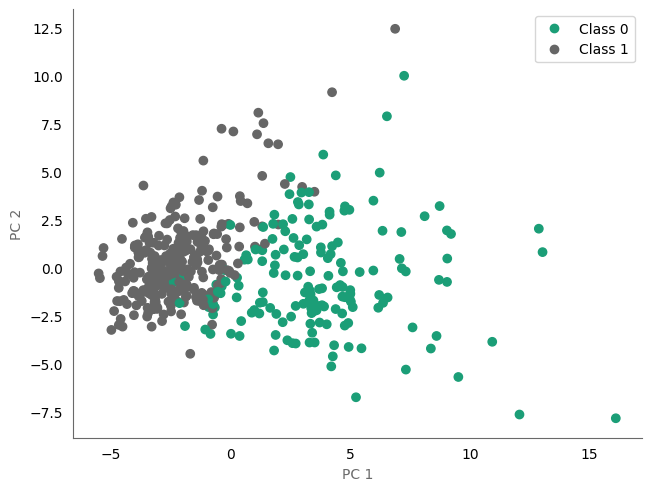

In [18]:
# Visualise 2 dimensions that explain most variance
fig, axes = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(6.4, 4.8))
axes.tick_params(bottom=False, left=False)
axes.grid(False)
axes.spines[['top', 'right']].set_visible(False)
axes.spines[['left', 'bottom']].set_color('dimgray')

scatter = axes.scatter(X_train_pca_df[0], X_train_pca_df[1], c=clean_train_df['target'].values, cmap='Dark2')
axes.legend(handles=scatter.legend_elements()[0], labels=['Class 0', 'Class 1'])
axes.set_xlabel('PC 1', fontsize=10, color='dimgray')
axes.set_ylabel('PC 2', fontsize=10, color='dimgray');

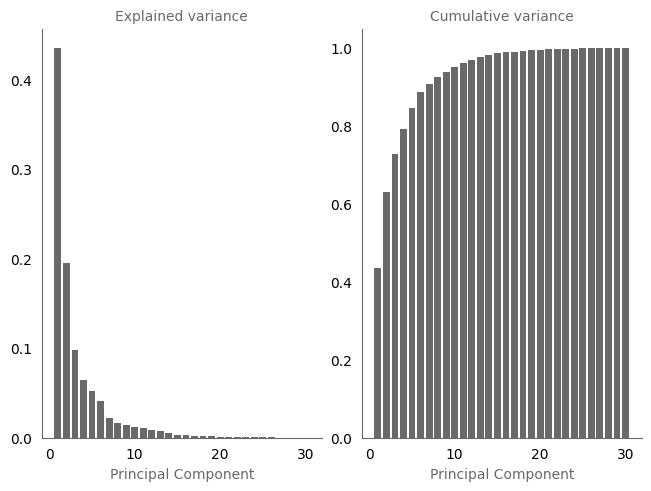

In [19]:
# Explained & cumulative variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

fig, axes = plt.subplots(
    nrows=1, ncols=2, constrained_layout=True, figsize=(6.4, 4.8))
i=0
for var in [explained_variance, cumulative_variance]:
    axes[i].bar(range(1, n_components+1), var, color='dimgray')
    axes[i].set_xlabel('Principal Component', fontsize=10, color='dimgray')
    i+=1

for ax in axes:
    ax.tick_params(bottom=False, left=False)
    ax.grid(False)
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color('dimgray')

axes[0].set_title('Explained variance', fontsize=10, color='dimgray');
axes[1].set_title('Cumulative variance', fontsize=10, color='dimgray');

In [20]:
def first_index_above_threshold(lst, threshold):
    """
    Returns the index of the first element above the threshold, or None if no such element is found.
    Parameters:
    - lst: List of numbers
    - threshold: Threshold value
    """
    for index, value in enumerate(lst):
        if value > threshold:
            return index
    return None

threshold = 0.95
print(f"Retaining {first_index_above_threshold(cumulative_variance, 0.95)} components accounts at least {threshold*100}% of variance")

Retaining 9 components accounts at least 95.0% of variance


# Predictive modelling

A logistic regression model was developed as the decision boundary (visualised above) appears to be linear.

## Background

**1) Logistic regression**

**a) Properties**

* For a single data point $(\boldsymbol{x_i}, y_i)$, logistic regression models:

    $P(Y=y_i | X = \boldsymbol{x_i})$

* It's relative simplicity makes it a high-bias and low-variance model

* It finds a linear boundary based on the log-odds (AKA logit function):

    $log\bigl(odds\bigr) = \theta^T\boldsymbol{x}$

    $log\bigl(\frac{P(Y = 1|\boldsymbol{X} = \boldsymbol{x})}{1 - P(Y = 1|\boldsymbol{X} = \boldsymbol{x})}\bigr) = \theta^T\boldsymbol{x}$

**b) Assumptions**

1. Linear relationship between log-odds (AKA logit) of the dependent variable and the independent variables

2. Independent observations

3. No perfect multicollinearity

    Note:  When features are highly correlated, the coefficients won't be as accurate (this can be addressed via regularisation, removal of features...)

4. No strongly influential outliers

5. No correlation between residuals and independent variables

6. Large sample size

**c) Implementation**

**_Log-odds_**

* Logistic regression is a linear model for the log-odds (AKA logit function):

    $log\bigl(odds\bigr) = \theta^T\boldsymbol{x}$

    $log\bigl(\frac{P(Y = 1|\boldsymbol{X} = \boldsymbol{x})}{1 - P(Y = 1|\boldsymbol{X} = \boldsymbol{x})}\bigr) = \theta^T\boldsymbol{x}$

**_Sigmoid function_**

* The sigmoid function, also known as the logistic function, is used to map log-odds to a probability

    $\forall z \in R$, $\sigma(z) \in [0,1]$

    $\sigma(z)=\frac{1}{1+exp-z}$

* It outputs numbers between $0$ and $1$. At input $0$, it outputs $0.5$.

    <img src="figures/sigmoid_func.png" align="center" width="300" />

**d) Optimisation**

**_Gradient descent_**

* There is no analytical solution, we cannot set $\frac{dLL(\theta)}{d\theta}=0$ and solve for $\theta$

* Gradient descent is used to optimise the *negative* log-likelihood function $-LL(\theta)$

     $\hat{\theta}_{ML} = \underset{\theta}{\operatorname{argmin}} -LL(\theta)$

**_Log-likelihood function_**

* The likelihood function $L(\theta)$ is the joint probability of the $n$ observed data points (viewed as a function of the parameters of the model):

    $L(\theta) = P(Y=\boldsymbol{y} | \boldsymbol{X}; \theta)$

    *Where $\boldsymbol{y} \in \mathbb{R}^n$ and $\boldsymbol{X} \in \mathbb{R}^{d \times n}$*

* Assuming i.i.d samples:

    $L(\theta) = \prod_{i=1}^n p(y_i | \boldsymbol{x_i}; \theta)$

    *Where $y_i \in \{0, 1\}$ and $\boldsymbol{x_i} \in \mathbb{R}^d$*

* Add the Bernoulli PMF & the logistic function:

    $L(\theta) = \prod_{i=1}^n p(y_i | \boldsymbol{x_i}; \theta)^{y_i}(1- p(y_i | \boldsymbol{x_i}; \theta))^{1-y_i}$

    $L(\theta) = \prod_{i=1}^n \sigma(\theta^T\boldsymbol{x_i})^{y_i}(1- \sigma(\theta^T\boldsymbol{x_i}))^{1-y_i}$

* Log-likelihood function $LL(\theta)$ is easier to optimise:

    $LL(\theta) = \sum_{i=1}^n y_i log\bigl[\sigma(\theta^T\boldsymbol{x_i})\bigr] + (1-y_i)log\bigl[1- \sigma(\theta^T\boldsymbol{x_i})\bigr]$

**e) Regularisation**

* An additional term is added to the objective function so the model has to minimise negative log-likelihood *and* parameter weights

* This controls the complexity of models and avoids overfitting.

**_Implications_**

* Regularisation results in biased estimates of coefficients

* Coefficients reflect the relationship between the independent variables and the dependent variable *after regularisation*

* Implication:

    - Absolute magnitudes does not directly represent variable importance
      
    - It's difficult to compare models with a different magnitude regularization parameter

**_L1-regularisation_**

* The L1-norm is used to penalise model complexity

* The L1 term is a function of the number and size of the coefficients:

    $ ||W||_1 = \sum_{j=1}^d |w_j| $

    *Where, W is the d-dimensional vector of model parameters (i.e. weights), which includes a dummy variable x<sub>0</sub>=1 for the y-intercept.*

*Properties:*

* In practice regularisation is achieved by keeping the magnitude of the weight vector below a threshold (e.g. 1)

    $\sum_{j=1}^d |w_j| \leq 1 $

    E.g. $|w_1| + |w_2| < 1$

* The area in which the optimal weight vector resides will therefore take the shape of a diamond centred on the origin

    <img src="figures/l1_l2_constraint.png" align="center" width="250" /> <img src="figures/l1_surface.png" align="center" width="350" />

* If gradient descent is used to optimise weights, L1 is more likely to to reduce coefficients to zero than L2 regularisation.

* Why? The gradient is constant even as weights approach zero in magnitude.

* L1 therefore tends to produce sparse solutions, which is useful for feature selection.

**_L2-regularisation_**

* The *squared* L2-norm is used to penalise model complexity

* The L2 term is a function of the number and size of the coefficients. It is equivalent to Euclidian distance:

    $ ||W||_2 = \sqrt{\sum_{j=1}^d w_j^2} $
    
    *Where, W is the d-dimensional vector of model parameters (i.e. weights), which includes a dummy variable x<sub>0</sub>=1 for the y-intercept.*

*Properties:*

* The L2-norm squares the individual model parameters. This means large weights are much more influential than smaller weights. Compared to L1 regularisation, L2 therefore prioritises minimising larger weights

* In practice regularisation is achieved by keeping the magnitude of the weight vector below a threshold (e.g. 1)

    $\sum_{j=1}^d w_j^2 \leq 1 $

    E.g. $|w_1|^2 + |w_2|^2 < 1$

* The area in which the optimal weight vector resides will therefore take the shape of a circle centred on the origin

    <img src="figures/l1_l2_constraint.png" align="center" width="250" /> <img src="figures/l2_surface.png" align="center" width="350" />

* If gradient descent is used to optimise weights, L2 is less likely to to reduce coefficients to zero than L1 regularisation.

* Why? The cost surface is smoother. Also, the gradient decreases as weights approach zero in magnitude. This slows the rate at which a weight decreases in value. 

* L2 therefore tends lead to weights with similar sizes. Although weights can get very very small, L2 is less likely to reduce coefficients to zero.

**f) Interpretation**

* Logistic regression is a linear model for the log-odds.
  
* Parameter weights do not influence the probability linearly.

**_Constant term $\theta_0$_**

* The intercept $\theta_0$ is the the log-odds of the outcome when all predictors other than $x_0$ are at $0$:

    $log\bigl(\frac{P(Y = 1|\boldsymbol{X} = \boldsymbol{0})}{1 - P(Y = 1|\boldsymbol{X} = \boldsymbol{0})}\bigr) = \theta_0x_0 = \theta_0$

    *Note: $x_0$ is always set to $1$*

* This can be converted to a probability using the logistic function:

    $P(Y = 1|\boldsymbol{X} = \boldsymbol{0}) = \sigma(\theta_0)=\frac{1}{1+exp(-\theta_0)}$

**_Variable coefficients_**

1. Continuous variables:

    * A change in feature $x_j$ by one unit increases the log odds by $\theta_j$:
    
        $log\bigl(\frac{odds_{x_j+1}}{odds_{x_j}}\bigr) = \theta_j$
    
    * A change in feature $x_j$ by one unit increases the odds by by $exp\bigl(\theta_j\bigr)$:
    
        $\frac{odds_{x_j+1}}{odds_{x_j}} = exp\bigl(\theta_j\bigr)$ 

2. Dummy variables

    * When feature $x_j=1$, the average log-odds is $\theta_j$ higher compared to the reference group
  
    * When feature $x_j=0$, the intercept returns to $\theta_0$

------------------------

**2) Performance metrics**

* The goal was to maximise recall with a nominal constraint of 50% for precision.

    *Note: While a single metric simplifies ranking model performance, the dataset's slight imbalance makes overall accuracy unsuitable.*

* F1-score was used during hyperparameter optimisation. 

**_Why?_**

* The performance metrics should align closely with the specific business problem at hand.

* Recall reflects the model's ability to identify all cancers (i.e. minimise false negatives). Whilst precision reflects the proportion of diagnoses which are correct (i.e. inverseley proportional to the number of false positives). 

* It is assumed the cost of a false negative prediction (i.e. incorrectly classifying a cancer as okay) outweighs the cost of a false positive prediction. The primary and secondary metrics are therefore recall and precision respectively.     

## Feature preprocessing

## Pipeline

In [21]:
pca = PCA()
scaler = StandardScaler() # z-score standardiser
logistic = LogisticRegression()

pipeline = Pipeline(
    steps=[("scaler", scaler),
           ("pca", pca),
           ("logistic", logistic)]
)

## Hyperparameter optimisation

* Logistic regression typically expects the target variable to be of integer type rather than object type. Hence the data type of target is converted to integer.

* Hyperparameters:

    1. Class weights
    
        * Class weights are set to None (by default). The log-likelihood objective function is not adjusted.
    
    2. Regularisation
    
        * Feature selection is achieved using L2 regularisation (by default)
      
            $L_2 = \lambda \sum_{i=1}^p |w_i|^2$
    
    3. Regularisation strength
    
        * Five-fold cross validation gridsearches are used to optimise the regularisation strength.
    
            Note: The regularisation parameter $C$ represents the inverse of regularization strength.

        * A value of $1$ appears to be optimal.

    4. Principal components
 
        * Five-fold cross validation gridsearches are used to optimise the number of principal components to retain.

        * A value of $15$ appears to be optimal.

In [22]:
def preprocess_features(df):
    """
    Return X/y dataframes from train/test dataframes
    """
    df['target'] = df['target'].astype(int)
    X = df[[x for x in df.columns if x!='target']]
    y = df['target']

    return X, y

In [23]:
X_train, y_train = preprocess_features(clean_train_df)

In [24]:
param_grid = {
    "pca__n_components": [5, 10, 15, 20], # principal components to keep
    "logistic__C": [0.1, 1, 10], # regularisation strength
}
grid_search = GridSearchCV(
    pipeline, param_grid, cv=5, scoring='f1'
)
grid_search.fit(
    X_train, y_train
)

best_pipeline = grid_search.best_estimator_
print("Best score:", grid_search.best_score_)
print("Optimal regularisation strength:", grid_search.best_params_['logistic__C'])
print("Optimal number of PCs:", grid_search.best_params_['pca__n_components'])

Best score: 0.9844059751500769
Optimal regularisation strength: 1
Optimal number of PCs: 15


## Evaluation

* A learning curve indicated minimal overfitting when using the maximum amount of training data.

* 5-fold cross-validation indicated the performance of the optimal model is stable.

* A precision-recall curve indicated adjustment of the classification threshold from the default of $0.5$ wouldn't improve performance significantly.

### Background

**1) Confidence intervals**

    "Confidence intervals define the interval which has a 0.95 probability of containing the true parameter"

    "the long run proportion of sample confidence intervals which will contain a true parameter"
    
* Logistic regression outputs a point estimate of the f1-score. This will vary from sample-to-sample.
  
* The confidence interval quantifies the uncertainty

**_a) Bootstrap estimate of confidence interval_**

* Estimate sampling distribution by bootstrapping (sampling w. replacement) & fitting multiple times

* Confidence interval encloses the relevant % of the sampling distribution

**_b) t-score estimate of confidence interval_**

* Compute F1-score

* Determine dof for t-distribution

  $df_{residual} = n - df_{model} = n- p - 1$

    *Model parameters are estimates and therefore introduce constraints on variability of residuals*

* Choose a confidence level

* Estimate the standard error

    $SE = \frac{s}{\sqrt{n}}$

* Compute critical t statistic value for the given confidence level

  *This will depend on the degrees of freedom*
 
* Compute margin of error

  $Margin = S.E \times t_{critical}$

* Construct confidence interval

    $CI = F1 \pm margin$

### Analyses

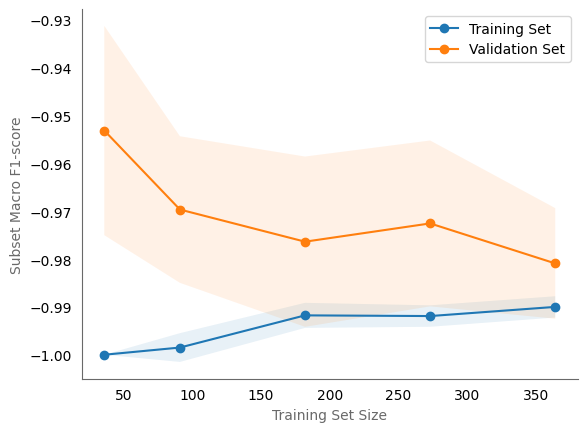

In [25]:
# Create a learning curve
train_sizes, train_scores, valid_scores = learning_curve(
    pipeline, X_train, y_train, train_sizes=[0.1, 0.25, 0.5, 0.75, 1.0], cv=5, scoring='f1', random_state=42
)

train_scores_mean = -np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = -np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

# Plot the learning curve with confidence intervals
fig, axes = plt.subplots(
    figsize=(6.4, 4.8)
)
axes.tick_params(bottom=False, left=False)
axes.grid(False)
axes.spines[['top', 'right']].set_visible(False)
axes.spines[['left', 'bottom']].set_color('dimgray')

axes.plot(train_sizes, train_scores_mean, label='Training Set', marker='o')
axes.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1)
axes.plot(train_sizes, valid_scores_mean, label='Validation Set', marker='o')
axes.fill_between(train_sizes, valid_scores_mean - valid_scores_std, valid_scores_mean + valid_scores_std, alpha=0.1)
axes.set_xlabel('Training Set Size', fontsize=10, color='dimgray')
axes.set_ylabel('F1-score', fontsize=10, color='dimgray')
axes.legend();

**2) Model stability**

In [26]:
cv = KFold(5)
scores = []
for i, (train_index, test_index) in enumerate(cv.split(X_train, y_train)):
    X_train_k, y_train_k = X_train.iloc[train_index], y_train.iloc[train_index]
    X_test_k, y_test_k = X_train.iloc[test_index], y_train.iloc[test_index]

    # Fit & predict
    pipeline.fit(X_train_k, y_train_k)
    y_pred_k = pipeline.predict(X_test_k)

    # Evaluate predictive performance
    print(f'\n-----------------------------Fold {i}-----------------------------')
    print(classification_report(y_test_k, y_pred_k, zero_division=0))
    scores.append(precision_recall_fscore_support(y_test_k, y_pred_k, average='binary'))

# Split metrics
precision = [x[0] for x in scores]
recall = [x[1] for x in scores]
f1 = [x[2] for x in scores]

print(f'\n-----------------------------Overall-----------------------------')
print(f"F1: {round(np.mean(f1), 3)} +/- {round(np.std(f1), 3)}")
print(f"Precision: {round(np.mean(precision), 3)} +/- {round(np.std(precision), 3)}")
print(f"Recall: {round(np.mean(recall), 3)} +/- {round(np.std(recall), 3)}")


-----------------------------Fold 0-----------------------------
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        30
           1       1.00      0.97      0.98        61

    accuracy                           0.98        91
   macro avg       0.97      0.98      0.98        91
weighted avg       0.98      0.98      0.98        91


-----------------------------Fold 1-----------------------------
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        28
           1       0.98      0.98      0.98        63

    accuracy                           0.98        91
   macro avg       0.97      0.97      0.97        91
weighted avg       0.98      0.98      0.98        91


-----------------------------Fold 2-----------------------------
              precision    recall  f1-score   support

           0       1.00      0.89      0.94        36
           1       0.93      1.00      

**3) Performance as a function of classification threshold**

In [27]:
def find_optimal_threshold(precision, recall, thresholds, min_precision=0.5):
    """
    Finds the probability threshold that maximises recall whilst ensuring precision is above or equal to a minimum value.
    """

    # The last precision and recall values are 1. and 0. respectively and do not have a corresponding threshold.
    precision = precision[:-1]
    recall = recall[:-1]
    
    # Ensure input lists have the same length
    assert len(precision) == len(recall) == len(thresholds), "Arrays must have the same length"

    # Filter thresholds based on the minimum precision requirement
    eligible_thresholds = [t for t, p in zip(thresholds, precision) if p >= min_precision]

    # If no eligible thresholds are found, return None
    if not eligible_thresholds:
        return None

    # Find the threshold that maximizes recall among the eligible thresholds
    optimal_threshold = max(eligible_thresholds, key=lambda t: recall[eligible_thresholds.index(t)])
    optimal_precision = precision[thresholds.tolist().index(optimal_threshold)]
    optimal_recall = recall[thresholds.tolist().index(optimal_threshold)]

    return optimal_threshold, optimal_precision, optimal_recall

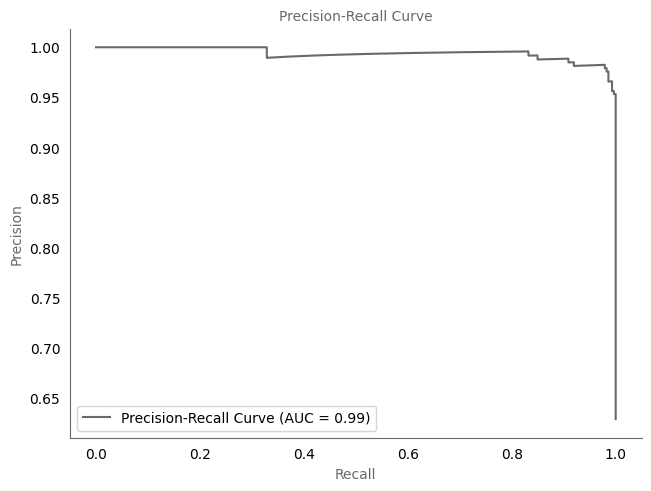

In [28]:
# Perform cross-validated predictions
y_pred = cross_val_predict(pipeline, X_train, y_train, cv=5, method='predict_proba')[:, 1]

# Calculate precision and recall
precisions, recalls, thresholds = precision_recall_curve(y_train, y_pred)

# Calculate area under the curve (AUC)
auc_score = auc(recalls, precisions)

# Plot figure
fig, axes = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(6.4, 4.8))
axes.tick_params(bottom=False, left=False)
axes.grid(False)
axes.spines[['top', 'right']].set_visible(False)
axes.spines[['left', 'bottom']].set_color('dimgray')

axes.plot(recalls, precisions, label=f'Precision-Recall Curve (AUC = {auc_score:.2f})', color='dimgray', alpha=1)
axes.set_title('Precision-Recall Curve',fontsize=10, color='dimgray')
axes.set_xlabel('Recall',fontsize=10, color='dimgray')
axes.set_ylabel('Precision',fontsize=10, color='dimgray')
axes.legend();

In [29]:
# Compute best recall given a minimum precision
min_precision = 0.5
optimal_threshold, optimal_precision, optimal_recall = find_optimal_threshold(precisions, recalls, thresholds, min_precision)
print(f"Optimal threshold: {optimal_threshold}")
print(f"Optimal recall: {optimal_recall}")
print(f"Optimal precision: {optimal_precision}")

Optimal threshold: 5.398316046666346e-24
Optimal recall: 1.0
Optimal precision: 0.6285714285714286


## Final model

### Model choice

The final model was trained with the following hyperparameters:

* Number of principal components: $15$
  
* Regularisation strength: $1$

### Evaluation

* The predictive performance of the final model was very good. The macro precision and recall were both $97\%$. Whilst precision and recall for the cancer class was $97\%$ and $99\%$ respectively.

In [30]:
X_train, y_train = preprocess_features(clean_train_df)
X_test, y_test = preprocess_features(clean_test_df)

              precision    recall  f1-score   support

           0       0.98      0.95      0.96        43
           1       0.97      0.99      0.98        71

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



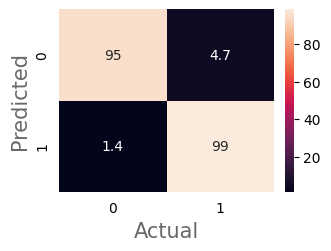

In [31]:
# Fit & Predict
pipeline.fit(X_train, y_train)
prob_pred = pipeline.predict_proba(X_test)[:, 1]

# Set a custom threshold for classification
custom_threshold = 0.5
y_pred = (prob_pred >= custom_threshold).astype(int)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion matrix
confusion_matrices_count = confusion_matrix(y_test, y_pred)
confusion_matrices_perc = np.around(confusion_matrix(y_test, y_pred, normalize='true')*100,1)

fig, axes = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(6.4/2, 4.8/2))
axes.tick_params(bottom=False, left=False)
axes.grid(False)
axes.spines[['top', 'right']].set_visible(False)
axes.spines[['left', 'bottom']].set_color('dimgray')

sns.heatmap(confusion_matrices_perc, ax=axes, annot=True, annot_kws={"fontsize":10})
axes.set_xlabel('Actual',fontsize=15, color='dimgray')
axes.set_ylabel('Predicted',fontsize=15, color='dimgray');